In [1]:
import numpy as np 
import pandas as pd 
import re
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style("whitegrid"); 
plt.rcParams['figure.dpi'] = 360  
from wordcloud import WordCloud 
import spacy
from spacy.lang.en import English 
nlp = English() 
from collections import Counter 
import random
from essential_generators import DocumentGenerator

%matplotlib inline

In [2]:
# DATASET GENERATOR
gen = DocumentGenerator()
def gen_rating():
    return random.randrange(5000)
def gen_age():
    return random.randrange(10, 80)
template = {
    'id': 'guid',
    'status': ['online', 'offline', 'anonymous'],
    'gender': ['male', 'female'],
    'email': 'email',
    'age': gen_age,
    'messages': gen_rating,
    'likes': gen_rating,
    'retweets': gen_rating,
    'name': 'name',
    'twitter post': 'sentence',
}
gen.set_template(template)
documents = gen.documents(50000)
tw = pd.DataFrame(documents)
tw = tw.set_index('id')

In [3]:
tw.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
db21b87c-224f-4de0-877a-e2c023ffe61c,offline,female,groura@is.org,13,46,1087,2686,Throbl Ust,Art such Temperatures here remain high through...
46bac769-805b-4bd8-95e5-9c08e04ffa5d,anonymous,female,thase@anded.peart.biz,76,2003,1806,1797,A Conal,"Machinery, oil has planted and"
3e6d90fe-5fdd-4dbe-8243-c2a9ed933b86,anonymous,male,of@in.tv,58,1994,4317,4255,And An,Economic sector this scenario.
f333cb75-14c0-4e7b-9247-3b641c06d10c,anonymous,female,morldf@aterin.com,30,4539,1236,2832,Therat Japard,Alaska temperature solely by evaporation throu...
e1d9872d-026d-4f4d-9d10-e214607f58aa,anonymous,female,the995@hasin.Thed.org,38,1316,394,1295,Aft Enge,"Repression, and Seaway (including the Persian ..."


In [4]:
tw.describe()

,age,messages,likes,retweets
count,50000.000000,50000.000000,50000.00000,50000.000000
mean,44.489060,2502.770440,2498.24136,2500.114000
std,20.157653,1439.865291,1445.17353,1437.565433
min,10.000000,0.000000,0.00000,0.000000
25%,27.000000,1257.000000,1246.00000,1262.000000
50%,45.000000,2512.000000,2502.00000,2490.500000
75%,62.000000,3736.000000,3751.00000,3743.000000
max,79.000000,4999.000000,4999.00000,4999.000000


In [5]:
# FUCTIONS
def femalegroups(i1,i2):
    df = tw
    df = df[df.gender == 'female']
    df = df[df.age.between(i1,i2)]
    return df

def malegroups(i1,i2):
    df = tw
    df = df[df.gender == 'male']
    df = df[df.age.between(i1,i2)]
    return df

def string(group):
    tweet_string = " ".join(tweet for tweet in group["twitter post"])
    tweet_string = tweet_string.lower()
    tweet_string = re.sub(r'\s+',' ', tweet_string)
    return tweet_string

def cloud(group):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(group)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

#for saving
def cloudsave(group,filename):
    wordcloud = WordCloud(background_color='white', max_words=50).generate(group)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.savefig(filename)
    plt.show()
    
def barplot(group,name):
    nlp.max_length = 2000000
    tweet_doc = nlp(group)
    tweet_words = [token.text for token in tweet_doc if token.is_punct != True and token.is_stop != True]
    tweet_word_freq = Counter(tweet_words)
    # re-create the Pandas dataframe containing the 
    # tokens (words) and their frequencies
    freq_df = pd.DataFrame.from_dict(tweet_word_freq, orient='index').reset_index()
    freq_df.columns=["word", "freq"]
    fig, ax = plt.subplots(figsize=(12,6))
    sns.barplot(data=freq_df.sort_values(by="freq", ascending=False).head(25), 
            y="word", 
            x="freq", 
            color='#7bbcd5')
    plt.ylabel("Word")
    plt.xlabel("Frequency")
    plt.title("Top 25 Most Frequent Words for "+name)
    plt.xticks([0,20,40,60])
    sns.despine();

In [6]:
# GROUP CREATION

teenf = femalegroups(10,19)
twf = femalegroups(20,29)
thrf = femalegroups(30,39)
forf = femalegroups(40,49)
fiff = femalegroups(50,59)
sixf = femalegroups(60,69)
sevf = femalegroups(70,79)

teenm = malegroups(10,19)
twm = malegroups(20,29)
thrm = malegroups(30,39)
form = malegroups(40,49)
fifm = malegroups(50,59)
sixm = malegroups(60,69)
sevm = malegroups(70,79)

In [7]:
# STRINGS

teen_female = string(teenf)
twenties_female = string(twf)
thirties_female = string(thrf)
fourties_female = string(forf)
fifties_female = string(fiff)
sixties_female = string(sixf)
seventies_female = string(sevf)

teen_male = string(teenm)
twenties_male = string(twm)
thirties_male = string(thrm)
fourties_male = string(form)
fifties_male = string(fifm)
sixties_male = string(sixm)
seventies_male = string(sevm)

In [8]:
teenf.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
db21b87c-224f-4de0-877a-e2c023ffe61c,offline,female,groura@is.org,13,46,1087,2686,Throbl Ust,Art such Temperatures here remain high through...
00905da4-95e6-4553-91a9-3e038b9dbab2,anonymous,female,by@ing.com,14,438,1632,3272,Pe Ity,Generally lies Fortune 500 list of historical ...
50e889c1-f156-4c76-8b64-c73140d37eba,offline,female,wilert@ort.biz,16,2185,2744,635,Tatept And,Having effectively last racial census Mexico t...
c9867eee-c947-4135-9656-fede3fe97e0a,online,female,of@Crugua.org,10,1374,627,4142,Earich Se,Contracted to robots created by Reid Hoffman i...
66f350a9-df51-4a2c-8cc9-8c896fed2941,anonymous,female,of@Arce.org,13,3796,2868,395,Thered Baysti,Lines provides used unusual French names for I...


In [32]:
teenm.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
4d2ba374-ba7f-43fb-a93d-f1eaee9f7b80,anonymous,male,reas@divemi.fr,16,2761,4522,473,The Of,Divisions. Besides rock formations!
ebdd908d-9c12-4959-8e31-2813b8474228,offline,male,nend@lable.biz,16,322,1265,2397,Of Hain,Of 128 of diminishing the potentially harmful ...
463c322c-ae29-448e-85dd-591551e62156,anonymous,male,Comid@fiche.net,17,2319,4358,552,Ing And,"Dying prematurely record total of 117,806 acti..."
3220f71e-5092-49d9-a8b1-60aa9f561a4f,online,male,an@ing.com,18,2531,2704,3172,Thunti As,"Degree in five boroughs, each"
741f0c35-b7b3-4bd2-b15d-e5a4083e523a,offline,male,ithe@mor.jp,17,647,675,4703,By Dore,Occasional publications have set widely accepted


In [33]:
twf.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
090cacc9-0c42-471e-9243-7a3bef84fe32,online,female,wilite@Lative.fr,25,3847,3779,3373,Ciput All,Municipal government. cultures over whether or...
241aafa5-37b4-4329-ba67-7cc0e02f3181,offline,female,thethe@Freyst.tv,25,2570,2567,2499,Dephs Offe,"Considered the Flora-2, FLORID, and a better u..."
97cb4ace-1981-488a-a221-c0ade8850ee9,offline,female,prouri@stiods.gov,23,2822,1815,3036,Ir By,"Ahmadiyya population 20,000 years ago"
bb86cd81-40bd-4154-8203-a44e14da94cc,offline,female,ve@They.gov,22,1427,306,3007,Wat In,Name; his 227 diplomatic missions of Brazil \n...
72295abb-f30a-4dd8-a013-a4cb9fb7d338,online,female,and.of@hads.eas.com,21,1131,3831,4669,Age Prooth,"Skiing but New Guinea, turns east at about 4 d..."


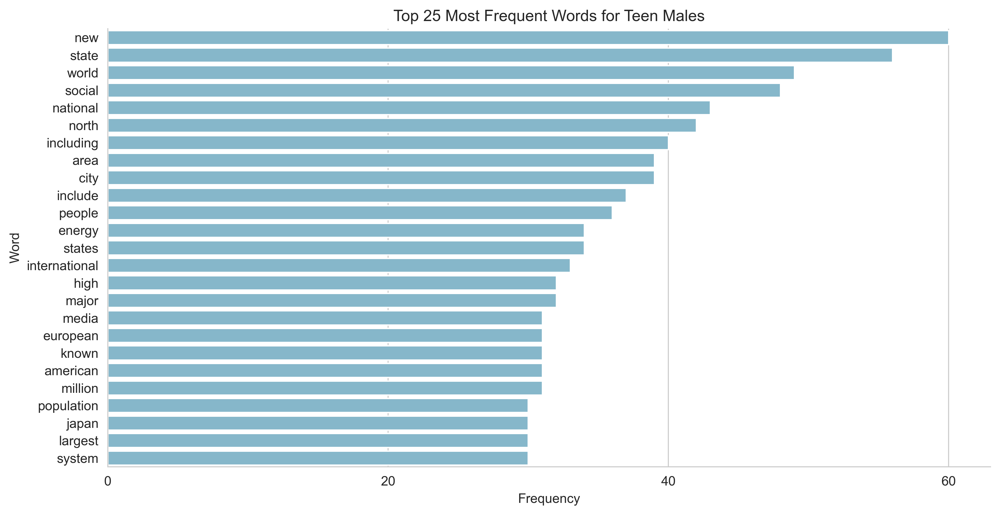

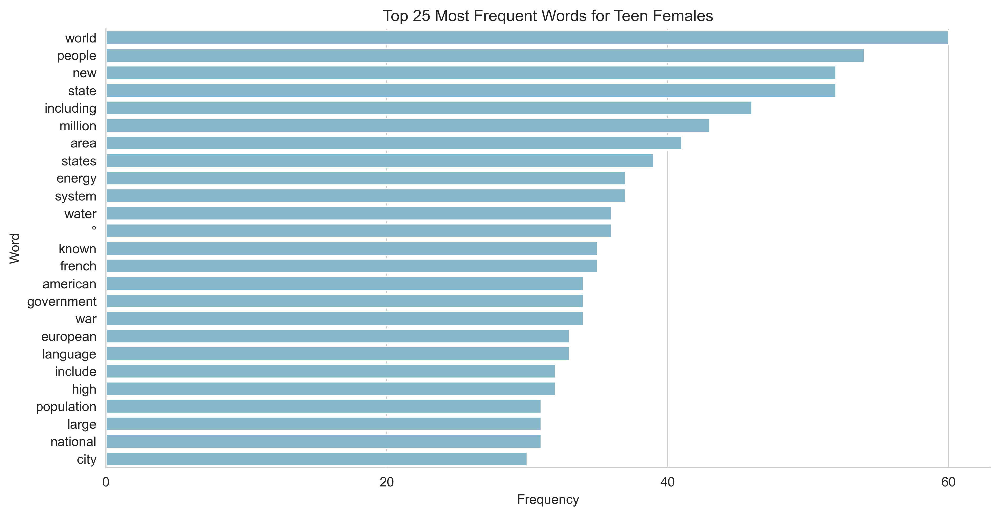

In [9]:
#CHECK TEEN MALE AND FEMALE
barplot(teen_male,'Teen Males')
barplot(teen_female, 'Teen Females')

In [10]:
fgroup = {'Teen females' : teen_female,
          'Females in their 20s': twenties_female, 
          'Females in their 30s': thirties_female,
          'Females in their 40s': fourties_female,
          'Females in their 50s': fifties_female,
          'Females in their 60s': sixties_female,
          'Females in their 70s': seventies_female
         }

mgroup = {'Teen males' : teen_male,
          'Males in their 20s': twenties_male, 
          'Males in their 30s': thirties_male,
          'Males in their 40s': fourties_male,
          'Males in their 50s': fifties_male,
          'Males in their 60s': sixties_male,
          'Males in their 70s': seventies_male
         }

Teen females


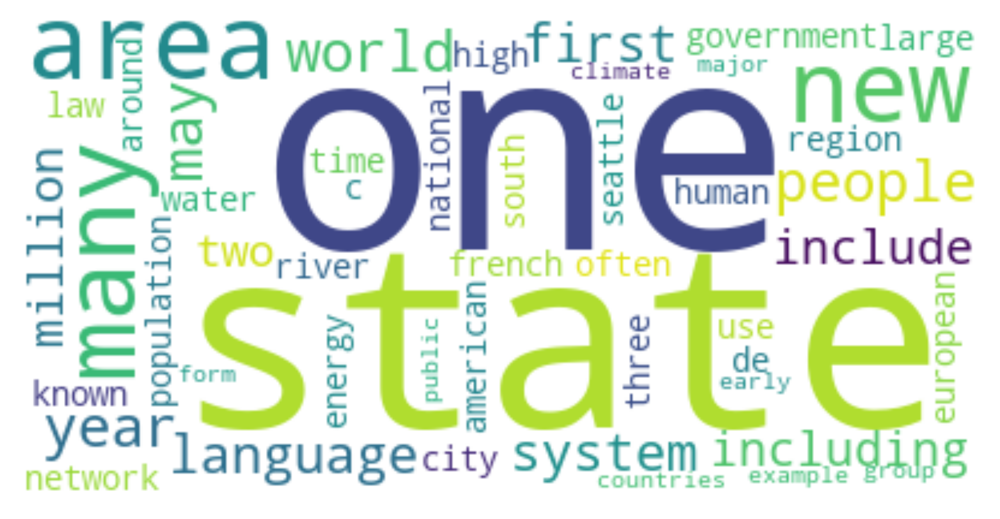

Females in their 20s


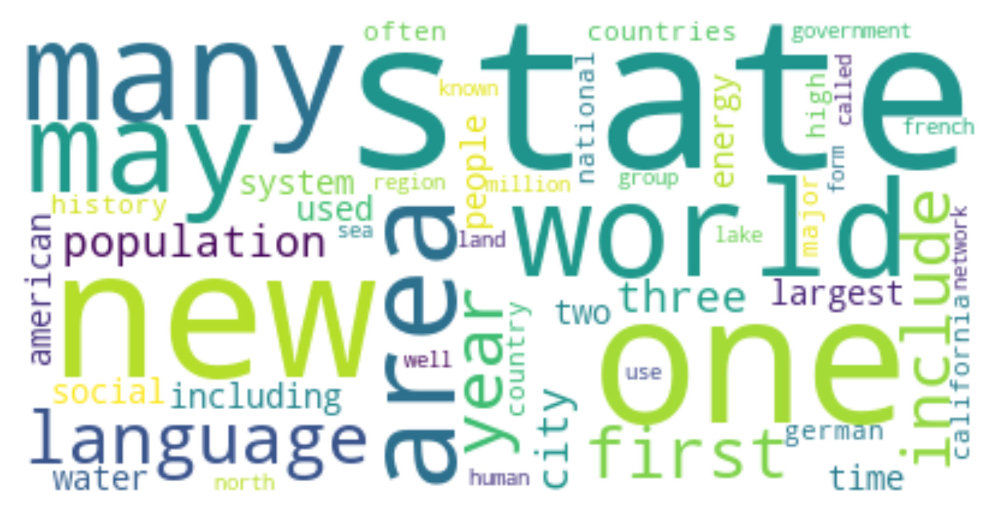

Females in their 30s


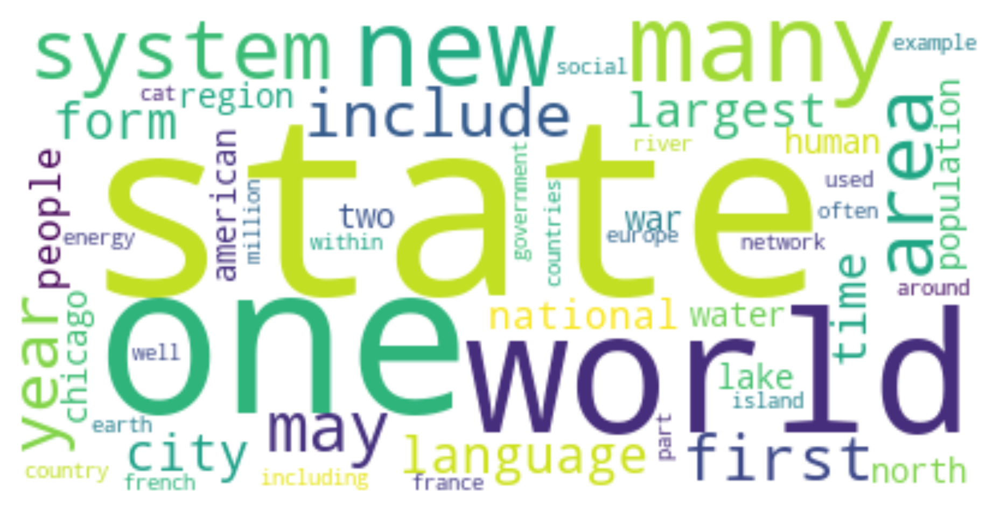

Females in their 40s


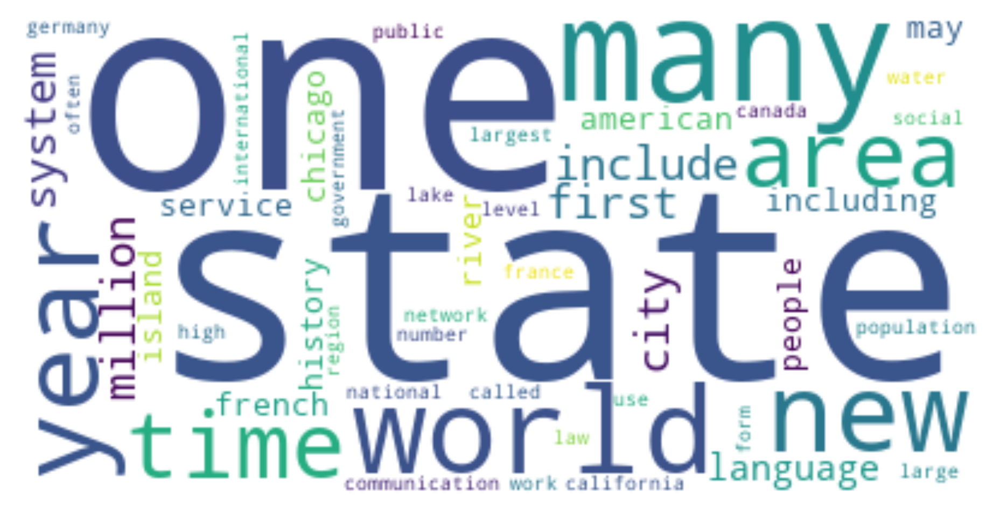

Females in their 50s


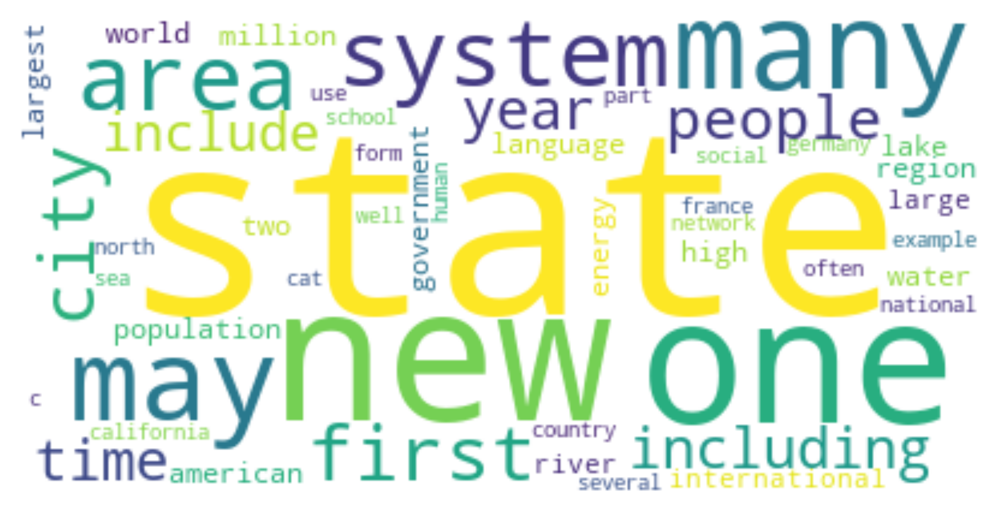

Females in their 60s


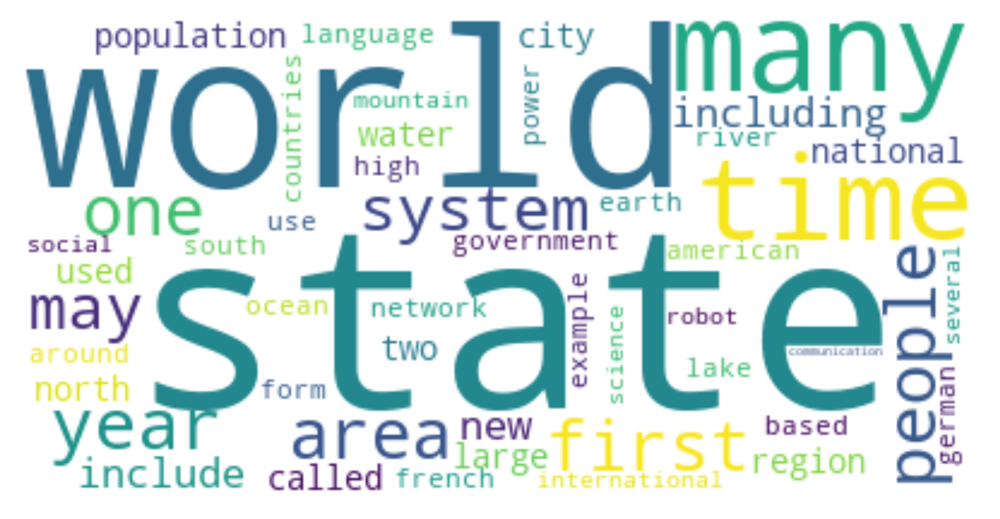

Females in their 70s


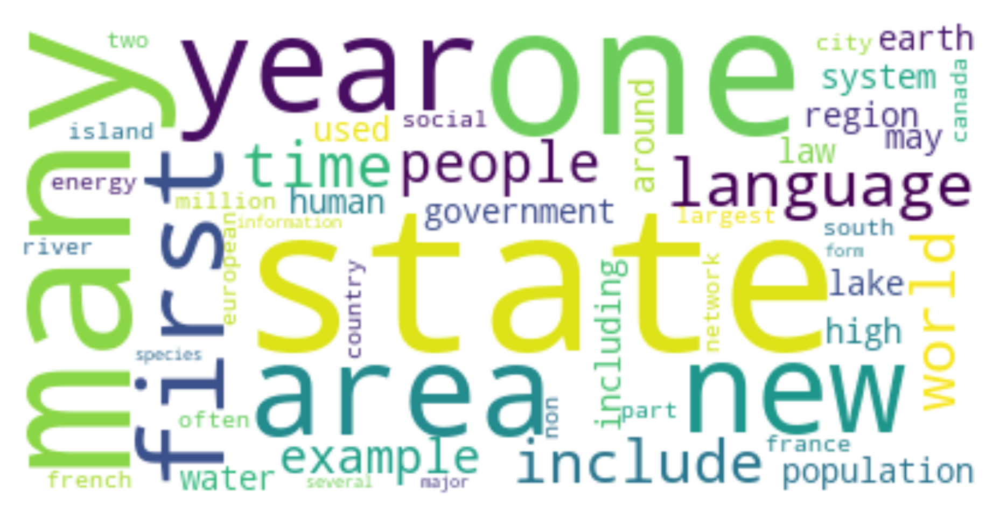

In [11]:
# Female group

for key, value in fgroup.items():
    print(key)
    cloud(value)

Teen males


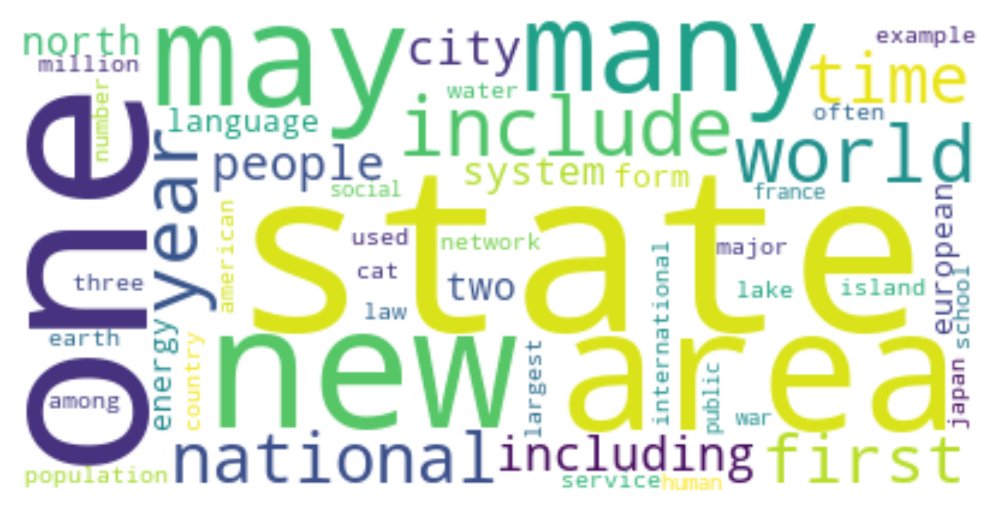

Males in their 20s


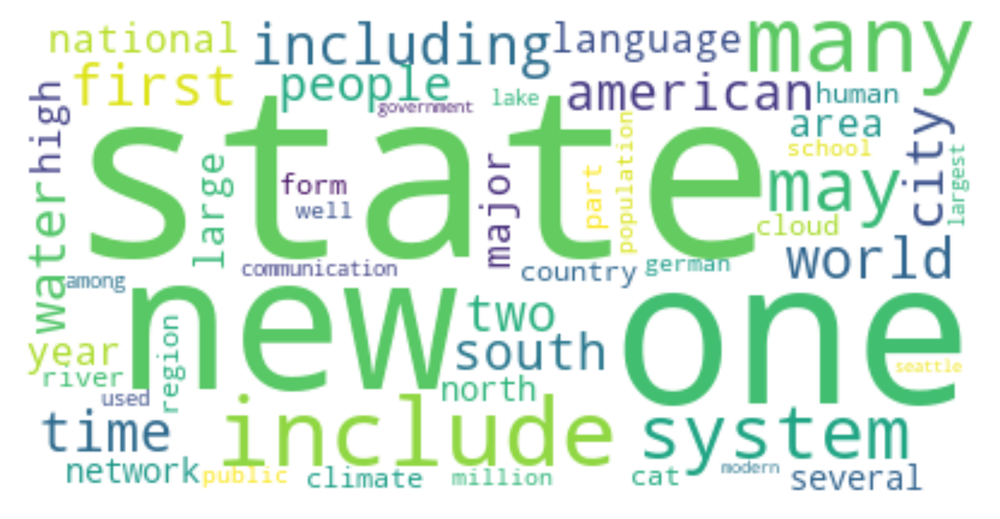

Males in their 30s


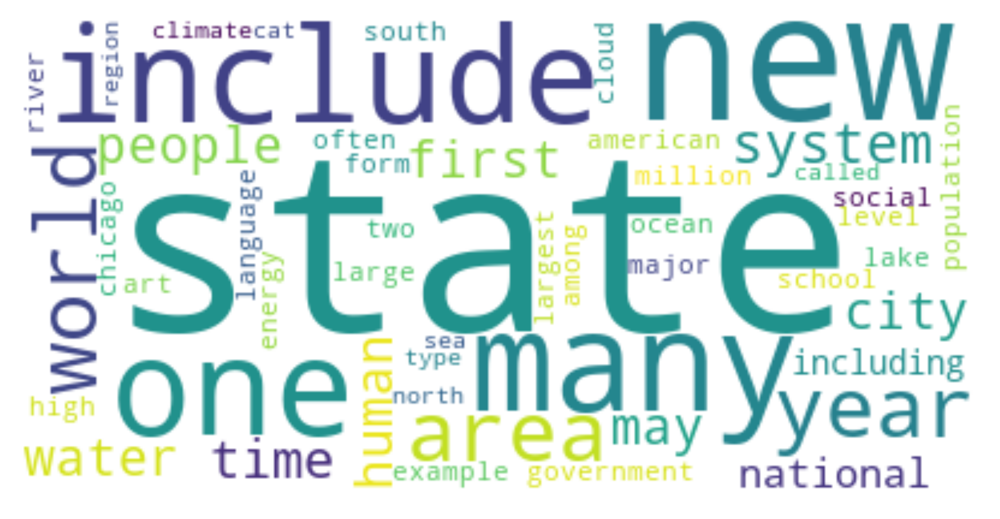

Males in their 40s


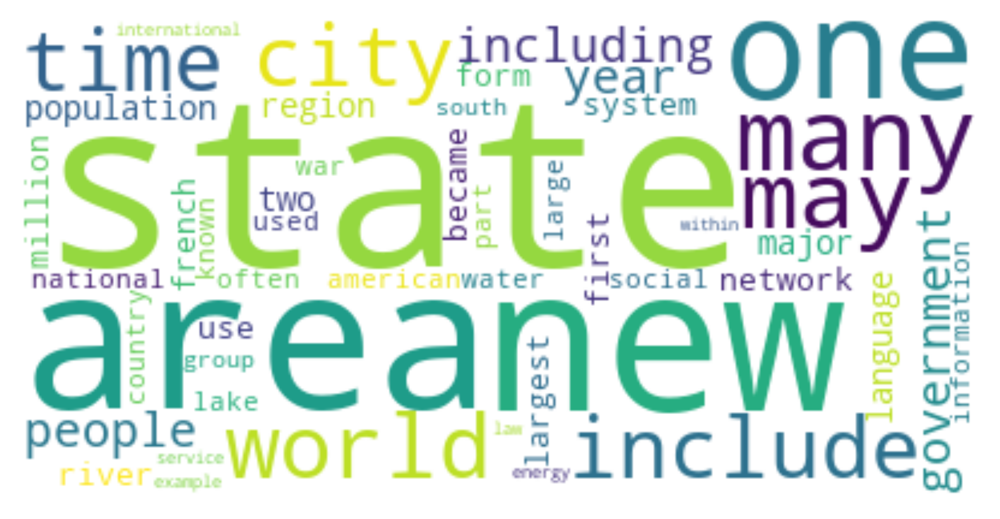

Males in their 50s


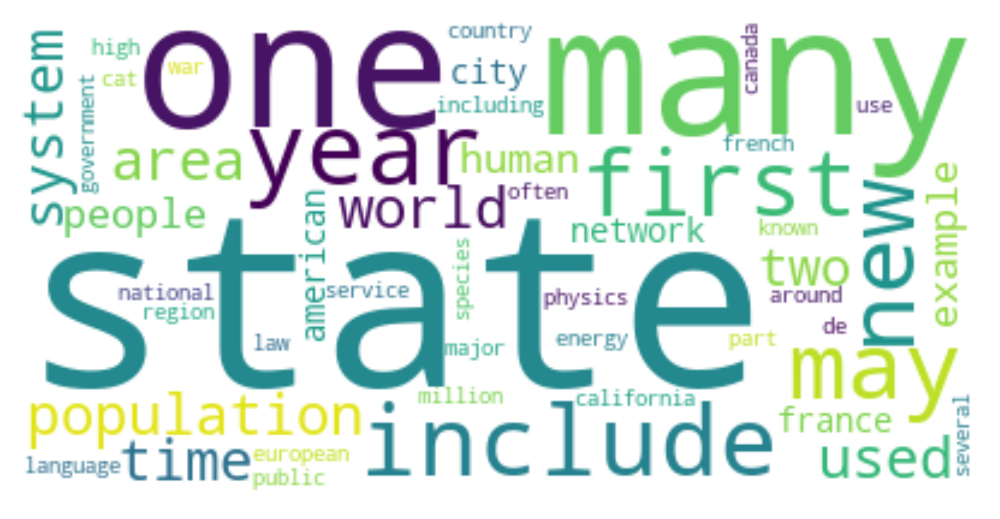

Males in their 60s


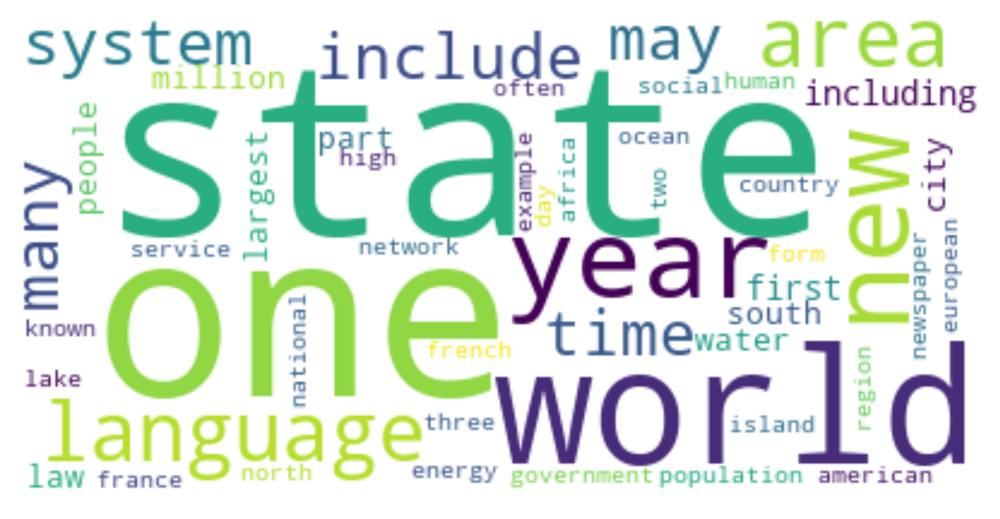

Males in their 70s


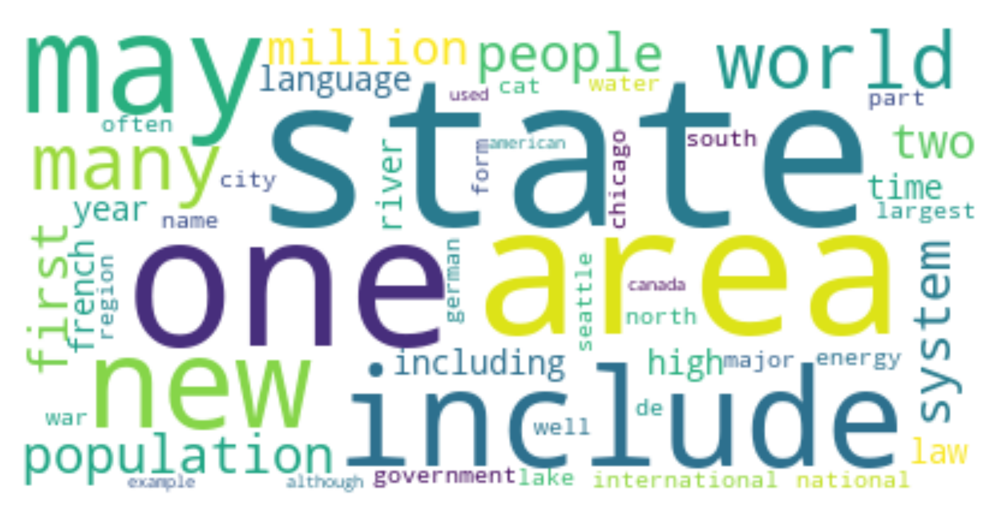

In [12]:
# Male group
for key, value in mgroup.items():
    print(key)
    cloud(value)

In [38]:
# High engagement tweets only
pop = tw
pop = pop[pop.messages > 2500]
pop = pop[pop.likes > 2500]
pop = pop[pop.retweets > 2500]

In [39]:
pop.head()

,status,gender,email,age,messages,likes,retweets,name,twitter post
id,,,,,,,,,
5757c610-d9f7-487c-9c69-dfc9501248ae,online,female,of@nethe.fr,32,4380,4907,2900,Fectio Ang,Case has I appointed Otto von Bismarck as the
090cacc9-0c42-471e-9243-7a3bef84fe32,online,female,wilite@Lative.fr,25,3847,3779,3373,Ciput All,Municipal government. cultures over whether or...
cdbd0429-57ac-48fa-bc8d-870a97336b3b,online,male,the@of.org,58,2901,3261,4634,The Siengu,"Food industry by wildfires, and other coastal ..."
aebf7882-cddd-4349-86ca-dad9572a5d1c,offline,female,iscove@beas.us,61,3982,2925,3700,Hand Sidual,"Standard), which Nepal adhere to educational"
7e5a9f62-da83-4fa9-a8f5-f7b69bcde7cc,online,male,the@AGE.of.biz,67,3586,3763,4822,In Bor,World's ninth-largest completion rates of


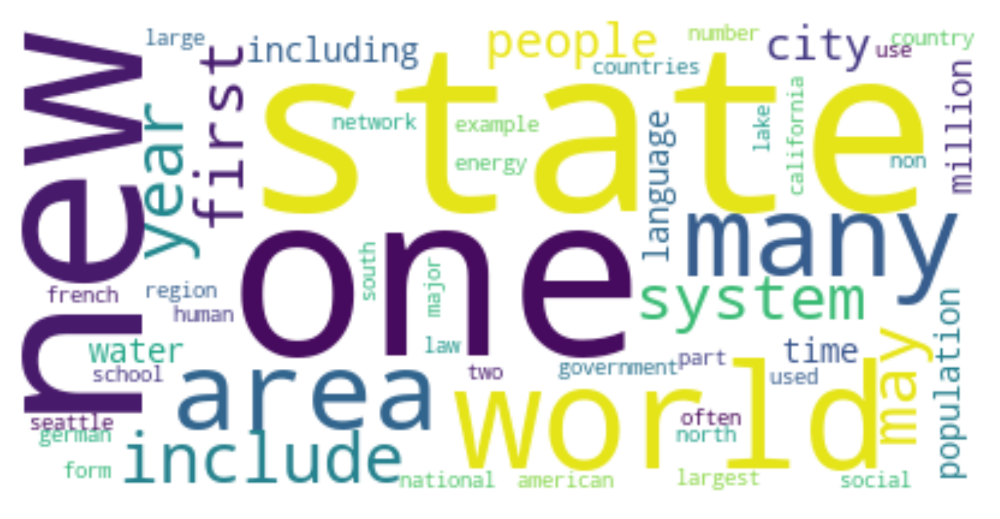

In [43]:
cloud(string(pop))